<div style='font-size:200%;'>
    <a id='nan'></a>
    <h1 style='color: darkslateblue; font-weight: bold; font-family: Cascadia code;'>
        <center> Stroke prediction </center>
    </h1>
</div>

<center> <img src="https://media.istockphoto.com/photos/man-with-brain-stroke-symptoms-picture-id1168179082?k=20&m=1168179082&s=612x612&w=0&h=9OY1eRZhghhh4LPvsnxE5vx6G9tVF4piDqvRMrBdp3Y="> </center>

- - -

<div style='font-size:200%;'>
    <a id='nan'></a>
    <h1 style='color: chartreuse; font-weight: bold; font-family: Cascadia code;'> Contents </h1>
</div>

- [Importing necessary libraries](#import)
- [Importing the data](#data)
- [Exploratory Data Analysis](#eda)
- [Distribution of individuals encountering stroke](#trans)
- [Data Pre-processing](#preprocess)
    - [Imputing missing data](#impute)
    - [One-Hot Encoding](#ohe)
    - [Splitting data into x (Values) and y (labels)](#split)
- [Classifying](#classify)
    - [Building and fitting the models](#build)
- [Performance Analysis of the different models](#anal)

- - -

<div style='font-size:200%;'>
    <a id='import'></a>
    <h1 style='color: maroon; font-weight: bold; font-family: Cascadia code;'>
        <center> Importing necessary libraries 📚 </center>
    </h1>
    <img src="https://miro.medium.com/max/1400/1*RIrPOCyMFwFC-XULbja3rw.png">
</div>

In [1]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt
import seaborn as sns

<div style='font-size:200%;'>
    <a id='clean'></a>
    <h1 style='color: orangered; font-weight: bold; font-family: Cascadia code;'>
        <center> Importing the dataset ⬇️ </center>
    </h1>
</div>

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/stroke-prediction-dataset/healthcare-dataset-stroke-data.csv


In [3]:
dataTrain = pd.read_csv('/kaggle/input/stroke-prediction-dataset/healthcare-dataset-stroke-data.csv')

In [4]:
dataTrain.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


<div style='font-size:200%;'>
    <a id='eda'></a>
    <h1 style='color: lightgreen; font-weight: bold; font-family: Cascadia code;'>
        <center> Exploratory Data Analysis 📊 </center>
    </h1>
</div>

<h1 align="center" ><a id='heatmap'><b>Null values heat-map<b></a></h1>

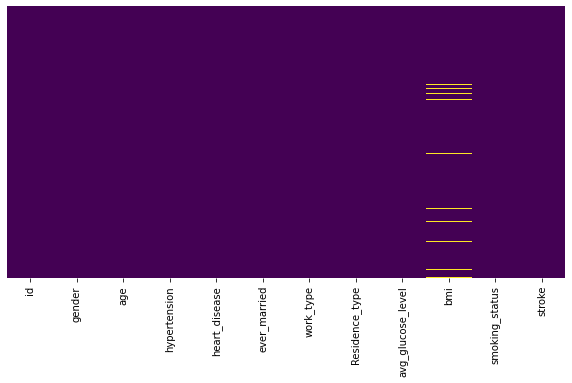

In [5]:
plt.figure(figsize=(10,5))
sns.heatmap(yticklabels=False, data=dataTrain.isnull(), cbar=False, cmap="viridis")
plt.show()

In [6]:
dataTrain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5110 entries, 0 to 5109
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5110 non-null   int64  
 1   gender             5110 non-null   object 
 2   age                5110 non-null   float64
 3   hypertension       5110 non-null   int64  
 4   heart_disease      5110 non-null   int64  
 5   ever_married       5110 non-null   object 
 6   work_type          5110 non-null   object 
 7   Residence_type     5110 non-null   object 
 8   avg_glucose_level  5110 non-null   float64
 9   bmi                4909 non-null   float64
 10  smoking_status     5110 non-null   object 
 11  stroke             5110 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 479.2+ KB


In [7]:
dataTrain.ever_married.unique()

array(['Yes', 'No'], dtype=object)

In [8]:
dataTrain.replace(to_replace="Urban", value=1, inplace=True)
dataTrain.replace(to_replace="Rural", value=0, inplace=True)

dataTrain.replace(to_replace="Yes", value=1, inplace=True)
dataTrain.replace(to_replace="No", value=0, inplace=True)

In [9]:
dataTrain.head()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,1,Private,1,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,1,Self-employed,0,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,1,Private,0,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,1,Private,1,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,1,Self-employed,0,174.12,24.0,never smoked,1


<h1 align="center" ><a id='corr'><b>Correlation between different features and our target variable<b></a></h1>

## **Correlation coefficient**

The correlation coefficient is a statistical measure of the strength of the relationship between the relative movements of two variables. The values range between -1.0 and 1.0. A calculated number greater than 1.0 or less than -1.0 means that there was an error in the correlation measurement. A correlation of -1.0 shows a perfect negative correlation, while a correlation of 1.0 shows a perfect positive correlation. A correlation of 0.0 shows no linear relationship between the movement of the two variables.

Text(0.5, 1.0, 'Correlation coefficient between different features and survived variable')

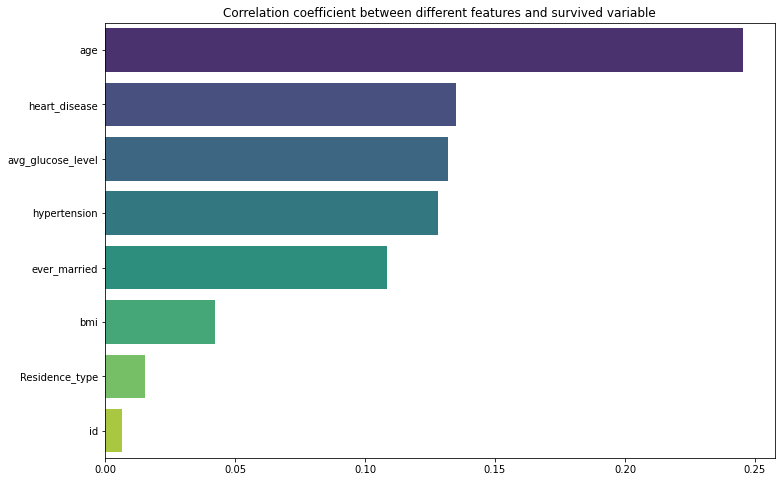

In [10]:
plt.figure(figsize=(12,8))
data = dataTrain.corr()["stroke"].sort_values(ascending=False)
indices = data.index
labels = []
corr = []
for i in range(1, len(indices)):
    labels.append(indices[i])
    corr.append(data[i])
sns.barplot(x=corr, y=labels, palette='viridis')
plt.title('Correlation coefficient between different features and survived variable')

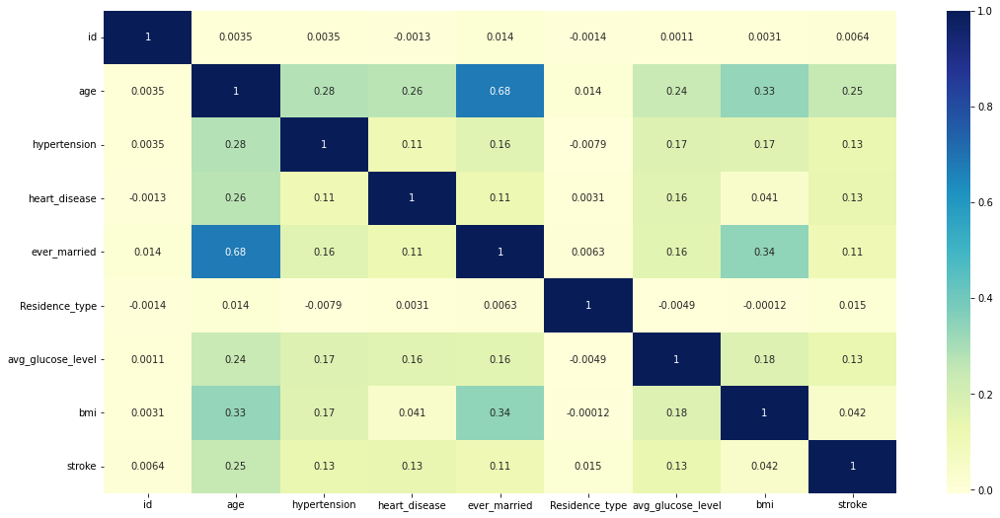

In [11]:
plt.figure(figsize=(18, 9))
sns.heatmap(dataTrain.corr(), cmap="YlGnBu", annot=True)
plt.show()

## We can see that Age is the most significant factor affecting the occurence of a stroke

<h1 align="center" ><a id='planet'><b>Distribution of Individuals based on Pclass<b></a></h1>

In [12]:
dataTrain.work_type.unique()

array(['Private', 'Self-employed', 'Govt_job', 'children', 'Never_worked'],
      dtype=object)

In [13]:
tWork = pd.crosstab(dataTrain['stroke'], dataTrain['work_type'])
tSmoke = pd.crosstab(dataTrain['stroke'], dataTrain['smoking_status'])

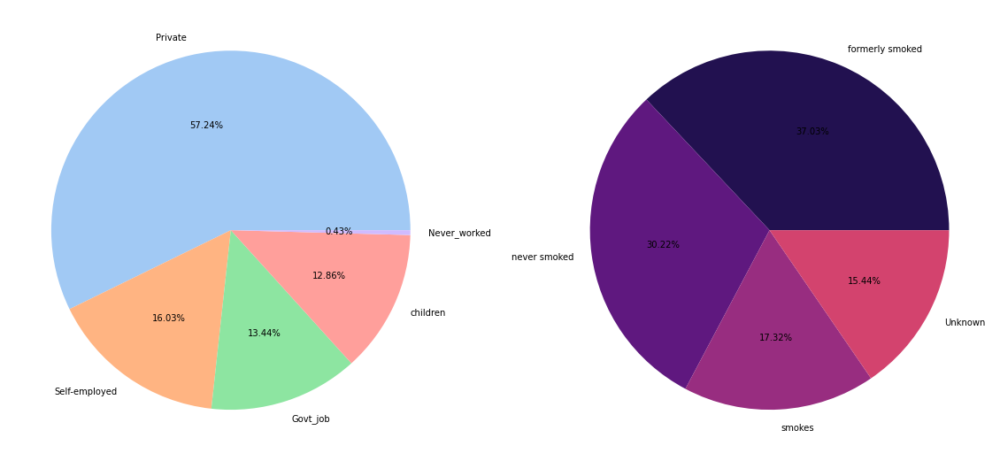

In [14]:
plt.figure(figsize=(20,10))
plt.subplot(1, 2, 1)
colors = sns.color_palette('pastel')
plt.pie([item/len(dataTrain.work_type) for item in dataTrain.work_type.value_counts()], labels=['Private', 'Self-employed', 'Govt_job', 'children', 'Never_worked'], colors=colors, autopct='%.2f%%')
plt.subplot(1, 2, 2)
colors = sns.color_palette('magma')
plt.pie([item/len(dataTrain.work_type) for item in dataTrain.smoking_status.value_counts()], labels=['formerly smoked', 'never smoked', 'smokes', 'Unknown'], colors=colors, autopct='%.2f%%')
plt.show()

<h1 align="center" ><a id='trans'><b>Distribution of individuals encountering stroke<b></a></h1>

Text(0, 0.5, 'Individuals with stroke: Smoking status')

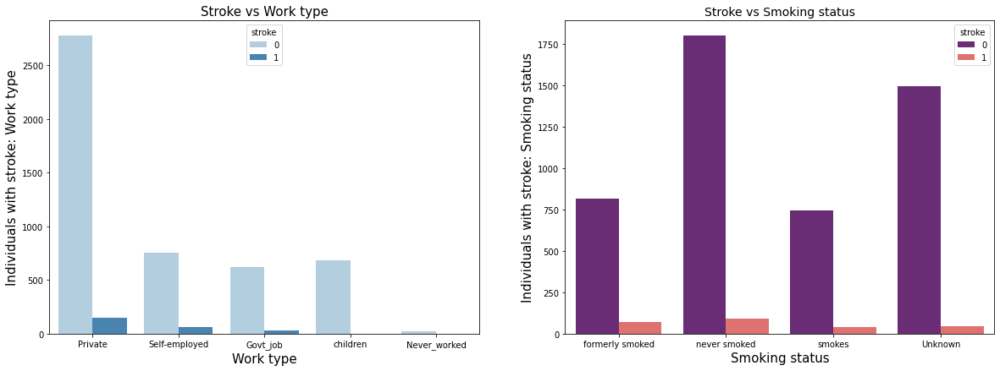

In [15]:
plt.figure(figsize=(20,15))
plt.subplot(2,2,1)
sns.countplot(x = dataTrain.work_type, hue = dataTrain.stroke, palette="Blues")
plt.title('Stroke vs Work type', fontsize=15)
plt.xlabel('Work type', fontsize=15)
plt.ylabel('Individuals with stroke: Work type', fontsize=15)

plt.subplot(2,2,2)
sns.countplot(x = dataTrain.smoking_status, hue = dataTrain.stroke, palette="magma")
plt.title('Stroke vs Smoking status', fontsize=14)
plt.xlabel('Smoking status', fontsize=15)
plt.ylabel('Individuals with stroke: Smoking status', fontsize=15)

<h1 align="center" ><a id='age'><b>Age & BMI distribution of the passengers<b></a></h1>

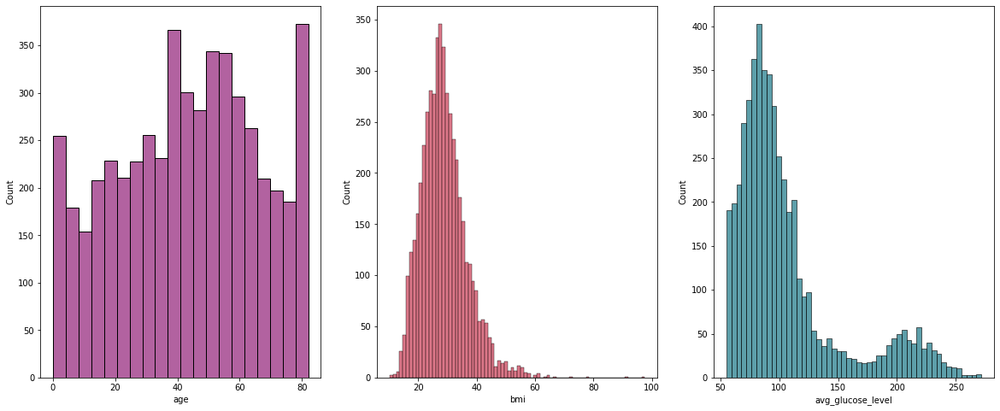

In [16]:
plt.figure(figsize=(20,8))
plt.subplot(1, 3, 1)
ax1 = sns.histplot(dataTrain.age, color=sns.color_palette('magma')[2])
plt.subplot(1, 3, 2)
ax2 = sns.histplot(dataTrain.bmi, color=sns.color_palette('flare')[2])
plt.subplot(1, 3, 3)
ax3 = sns.histplot(dataTrain.avg_glucose_level, color=sns.color_palette('viridis')[2])
ax1.grid(False)
ax2.grid(False)
ax3.grid(False)
plt.show()

<h1 align="center" ><a id='scatter'><b>Scatterplot of raw data<b></a></h1>

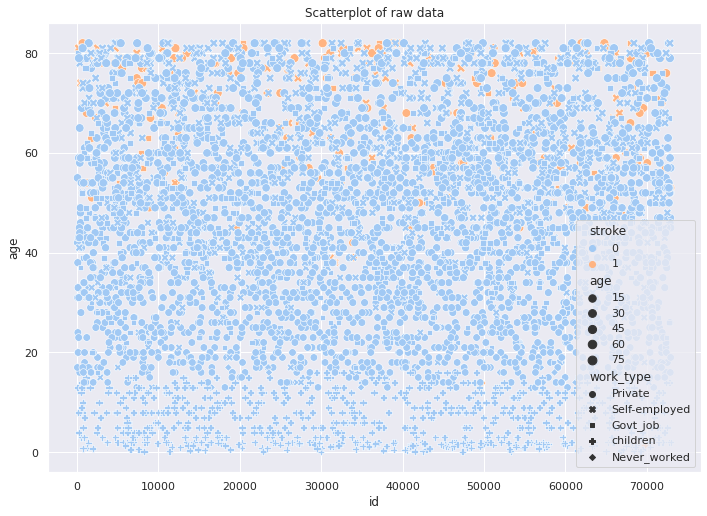

In [17]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.scatterplot(x=dataTrain.id, y=dataTrain.age, hue=dataTrain.stroke, style=dataTrain.work_type, size=dataTrain.age, sizes=(50,80), palette="pastel")
plt.title('Scatterplot of raw data')
plt.show()

<h1 align="center" ><a id='par'><b>ever_married and heart_disease distribution of the passengers<b></a></h1>

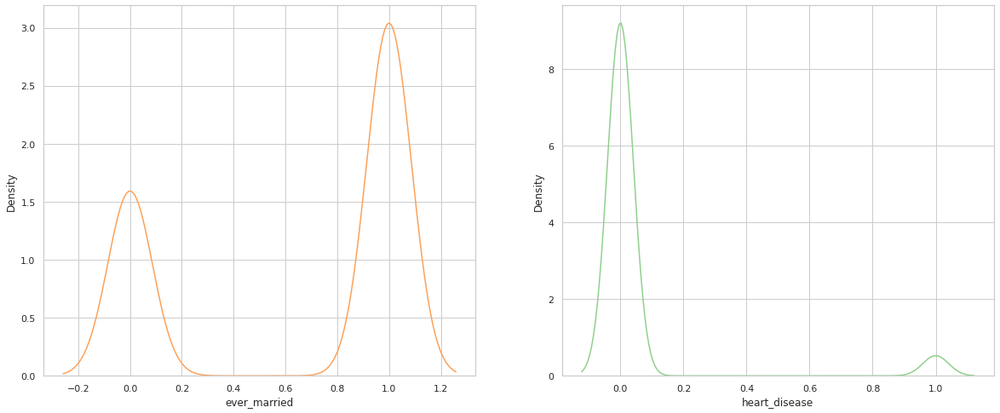

In [18]:
sns.set_style("whitegrid")
plt.figure(figsize=(20,8))
plt.subplot(1, 2, 1)
sns.kdeplot(dataTrain.ever_married, color=sns.color_palette('Oranges')[2])
plt.subplot(1, 2, 2)
sns.kdeplot(dataTrain.heart_disease, color=sns.color_palette('Greens')[2])
plt.show()

## **Most of the individuals have married and do not have any heart disease in our data space**

<h1 align="center" ><a id='embarked'><b>Significance of Hypertension in stroke<b></a></h1>

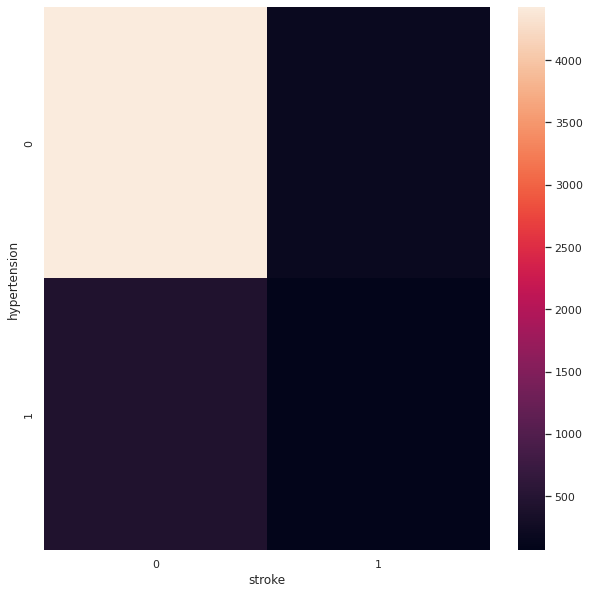

In [19]:
plt.figure(figsize = (10, 10))
sns.heatmap(pd.crosstab(dataTrain['hypertension'],dataTrain['stroke']))
plt.show()

## Autovisualization

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 473.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 4.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.9/12.9 MB 26.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.5/96.5 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 31.8 MB/s eta 0:00:00
  Attempting uninstall: panel
    Found existing installation: panel 0.13.1
    Uninstalling panel-0.13.1:
      Successfully uninstalled panel-0.13.1
  Attempting uninstall: holoviews
    Found existing installation: holoviews 1.15.0
    Uninstalling holoviews-1.15.0:
      Successfully uninstalled holoviews-1.15.0
Alert! from version 0.1.43, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
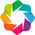

Shape of your Data Set loaded: (5110, 12)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        1 variables removed since they were ID or low-information variables
Number of All Scatter Plots = 6
All Plots done
Time to run AutoViz = 3 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


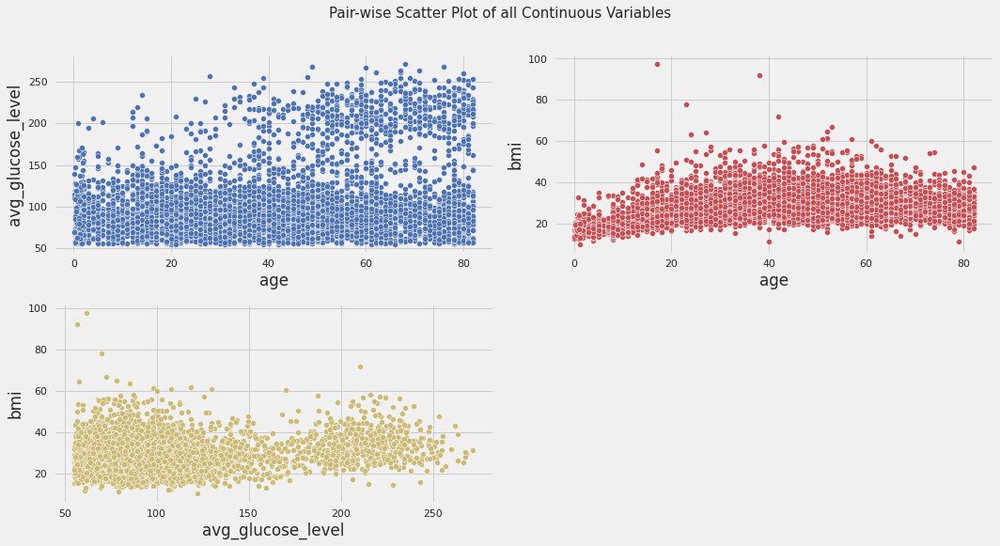

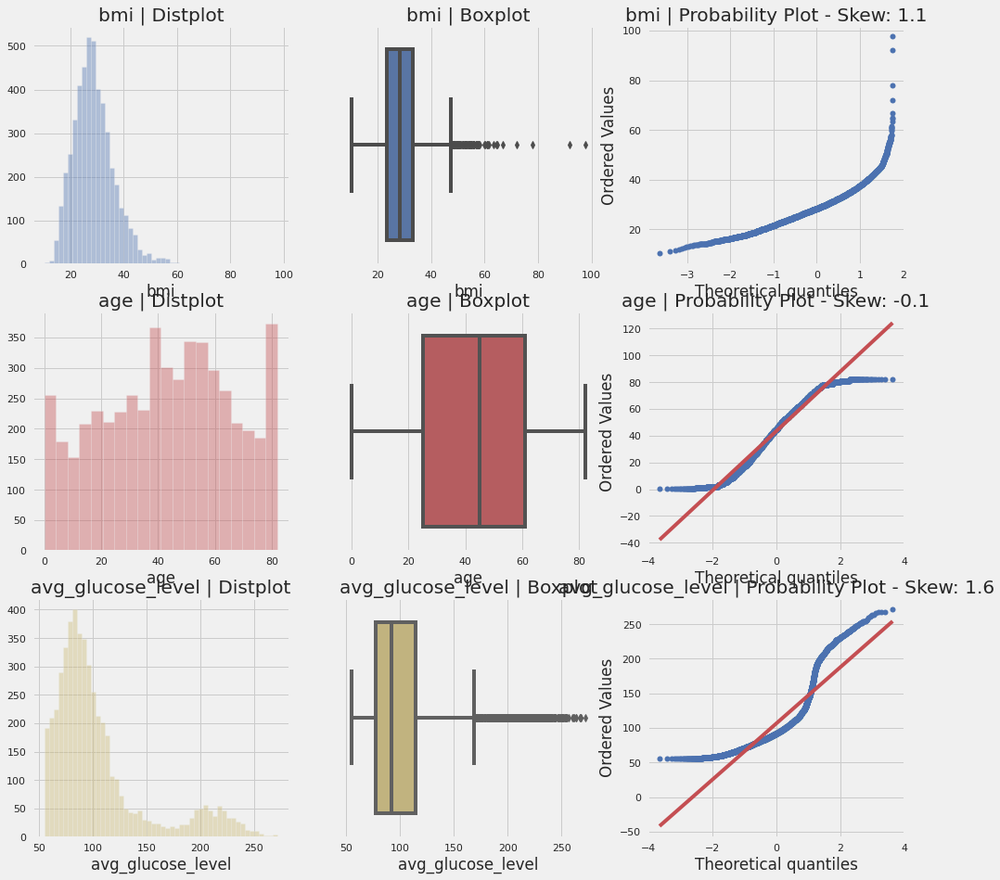

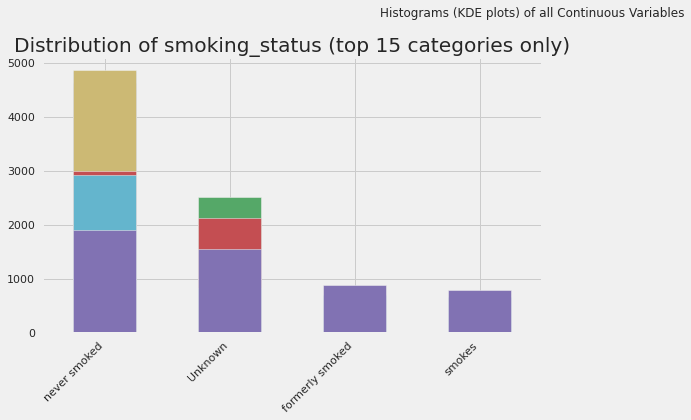

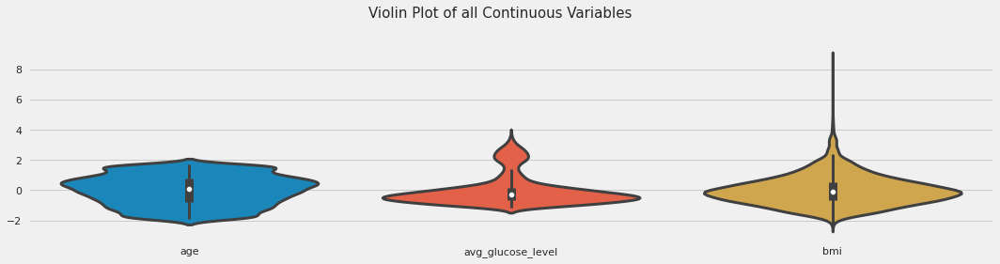

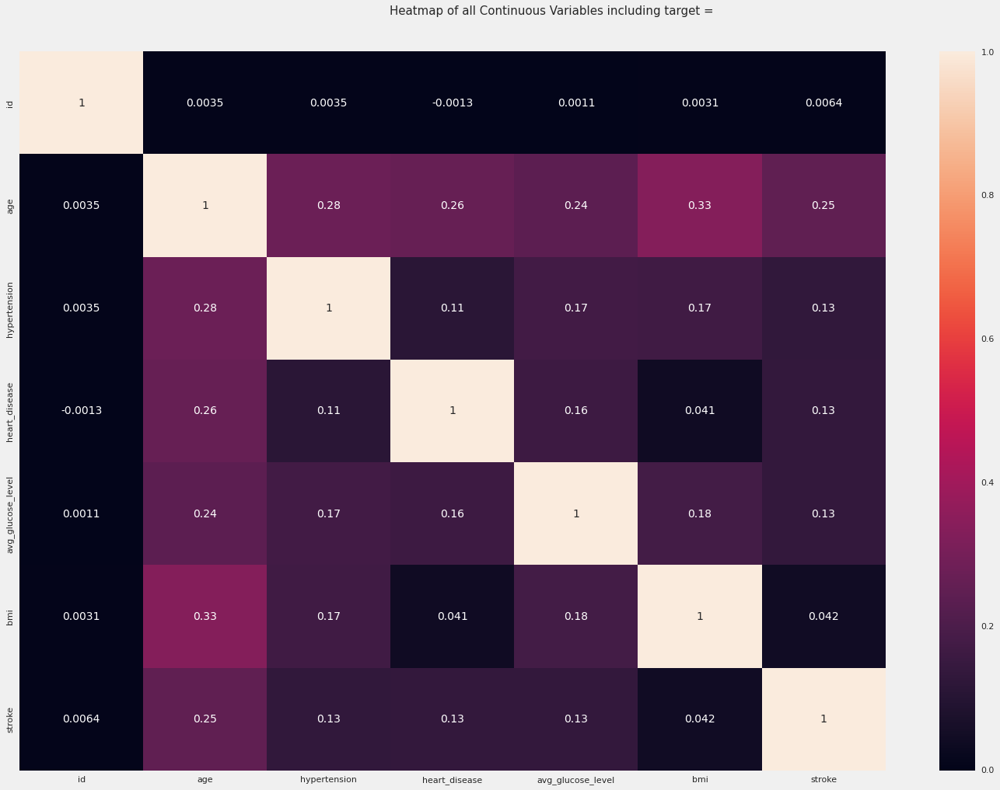

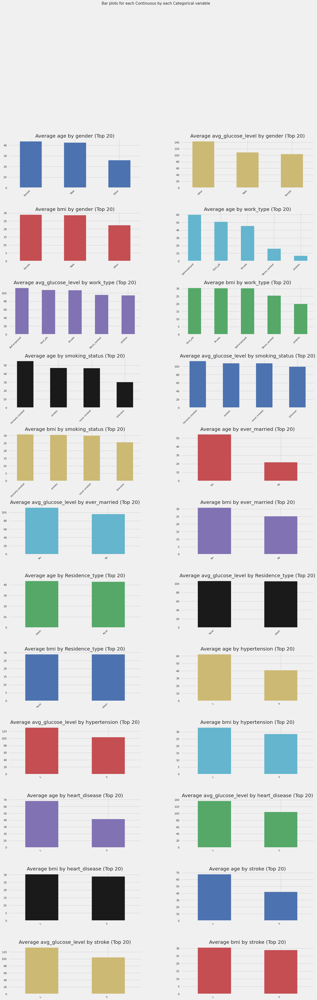

In [20]:
!pip install autoviz
plt.figure(figsize = (10, 5))
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df_av = AV.AutoViz('../input/stroke-prediction-dataset/healthcare-dataset-stroke-data.csv')
plt.show()

<div style='font-size:200%;'>
    <a id='preprocess'></a>
    <h1 style='color: purple; font-weight: bold; font-family: Cascadia code;'>
        <center> Data Pre-processing ⌛ </center>
    </h1>
</div>

<h1 align="center" ><a id='impute'><b>Imputing missing data<b></a></h1>

## **Data imputation**

Imputation is a technique used for replacing the missing data with some substitute value to retain most of the data/information of the dataset. These techniques are used because removing the data from the dataset every time is not feasible and can lead to a reduction in the size of the dataset to a large extend, which not only raises concerns for biasing the dataset but also leads to incorrect analysis.

In [21]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
dataTrain = pd.DataFrame(imputer.fit_transform(dataTrain), columns=dataTrain.columns, index=dataTrain.id)
dataTrain = dataTrain.reset_index(drop=True)

In [22]:
dataTrain.isnull().sum()

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

<h1 align="center" ><a id='ohe'><b>One-Hot Encoding 🔥<b></a></h1>

## **One-Hot Encoding**
One hot encoding is one method of converting data to prepare it for an algorithm and get a better prediction. With one-hot, we convert each categorical value into a new categorical column and assign a binary value of 1 or 0 to those columns. Each integer value is represented as a binary vector. All the values are zero, and the index is marked with a 1.

In [23]:
dataTrain = pd.get_dummies(dataTrain, columns=['work_type', 'smoking_status', 'gender'])
dataTrain.drop(columns=['id'], inplace=True)
dataTrain.head()

,age,hypertension,heart_disease,ever_married,Residence_type,avg_glucose_level,bmi,stroke,work_type_Govt_job,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,smoking_status_Unknown,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes,gender_Female,gender_Male,gender_Other
0,67.0,0,1,1,1,228.69,36.6,1,0,0,1,0,0,0,1,0,0,0,1,0
1,61.0,0,0,1,0,202.21,28.7,1,0,0,0,1,0,0,0,1,0,1,0,0
2,80.0,0,1,1,0,105.92,32.5,1,0,0,1,0,0,0,0,1,0,0,1,0
3,49.0,0,0,1,1,171.23,34.4,1,0,0,1,0,0,0,0,0,1,1,0,0
4,79.0,1,0,1,0,174.12,24.0,1,0,0,0,1,0,0,0,1,0,1,0,0


<h1 align="center" ><a id='split'><b>Splitting data into x (Values) and y (labels) 🪓<b></a</h1>

In [24]:
yData = dataTrain.pop('stroke').to_numpy()
xData = dataTrain.to_numpy()

xData = xData.astype(np.float32)
yData = yData.astype(np.float32)
xData.shape, yData.shape

((5110, 19), (5110,))

In [25]:
SPLIT = int(0.70*len(xData))

xTrain = xData[:SPLIT]
yTrain = yData[:SPLIT]

xTest = xData[SPLIT:]
yTest = yData[SPLIT:]

<div style='font-size:200%;'>
    <a id='classify'></a>
    <h1 style='color: orange; font-weight: bold; font-family: Cascadia code;'>
        <center> Classifying 🔃 </center>
    </h1>
</div>

<h1 align="center" ><a id='build'><b>Building and fitting the models 🏗️<b></a></h1>

## **Logistic regression**

Logistic regression estimates the probability of an event occurring, such as voted or didn't vote, based on a given dataset of independent variables. Since the outcome is a probability, the dependent variable is bounded between 0 and 1.

In [26]:
from sklearn.linear_model import LogisticRegression
lrClassifier = LogisticRegression()
lrClassifier.fit(xTrain, yTrain)
lrClassifier.score(xTrain, yTrain)

0.9309477215543752

## **The K-nearest neighbours**

The K-nearest neighbours (KNN) classifier uses proximity to make classifications or predictions about independent data points. This technique may be used for both classification and regression scenarios and the output will vary. In classification instances, a decision is made based on majority vote, i.e., the class assigned to the new data point is taken to be the one that is most frequently seen in the vicinity of the point. KNN is also known as a lazy learner technique since a model is not learned. Instead, the raw data is stored and used everytime a prediction must be made.

In [27]:
from sklearn.neighbors import KNeighborsClassifier

knnClassifier = KNeighborsClassifier(10)
knnClassifier.fit(xTrain, yTrain)
knnClassifier.score(xTrain, yTrain)

0.9315068493150684

## **Support Vector Classifier**

Support Vector Machine or SVM is one of the most popular Supervised Learning algorithms, which is used for Classification as well as Regression problems. However, primarily, it is used for Classification problems in Machine Learning.

The goal of the SVM algorithm is to create the best line or decision boundary that can segregate n-dimensional space into classes so that we can easily put the new data point in the correct category in the future. This best decision boundary is called a hyperplane. SVM chooses the extreme points/vectors that help in creating the hyperplane.

In [28]:
from sklearn.svm import SVC

svClassifier = SVC()
svClassifier.fit(xTrain, yTrain)
svClassifier.score(xTrain, yTrain)

0.9303885937936819

## **Random forest classifier**

The random forest classifier is an improvement over decision tree classifiers. Based on ensemble learning, a random forest classifier contains a number of decision trees on various subsets of the given dataset and takes the average to improve the predictive accuracy of that dataset. In general, a greater number of trees in the forest leads to higher accuracy and prevents the problem of overfitting.

In [29]:
from sklearn.ensemble import RandomForestClassifier

rfClassifier = RandomForestClassifier()
rfClassifier.fit(xTrain, yTrain)
rfClassifier.score(xTrain, yTrain)

1.0

## **Naive Bayes classifier**

Naive Bayes makes the assumption that the features are independent. This means that we are still assuming class-specific covariance matrices (as in QDA), but the covariance matrices are diagonal matrices. This is due to the assumption that the features are independent.

So, given a training dataset of N input variables x with corresponding target variables t, (Gaussian) Naive Bayes assumes that the class-conditional densities are normally distributed.

In [30]:
from sklearn.naive_bayes import GaussianNB

nbClassifier = GaussianNB()
nbClassifier.fit(xTrain, yTrain)
nbClassifier.score(xTrain, yTrain)

0.40061504053676267

## **AdaBoost classifier**

AdaBoost also called Adaptive Boosting is a technique in Machine Learning used as an Ensemble Method. The most common algorithm used with AdaBoost is decision trees with one level that means with Decision trees with only 1 split. These trees are also called Decision Stumps. What this algorithm does is that it builds a model and gives equal weights to all the data points. It then assigns higher weights to points that are wrongly classified. Now all the points which have higher weights are given more importance in the next model. It will keep training models until and unless a lowe error is received.

In [31]:
from sklearn.ensemble import AdaBoostClassifier
abClassifier = AdaBoostClassifier()
abClassifier.fit(xTrain, yTrain)
abClassifier.score(xTrain, yTrain)

0.9312272854347219

## **Decision Tree classifier**

Decision Tree is a Supervised learning technique that can be used for both classification and Regression problems, but mostly it is preferred for solving Classification problems. It is a tree-structured classifier, where internal nodes represent the features of a dataset, branches represent the decision rules and each leaf node represents the outcome.

In [32]:
from sklearn.tree import DecisionTreeClassifier
dtClassifier = DecisionTreeClassifier()
dtClassifier.fit(xTrain, yTrain)
dtClassifier.score(xTrain, yTrain)

1.0

<h1 align="center" ><a id='anal'><b>Performance Analysis of the different models 📈<b></a></h1>

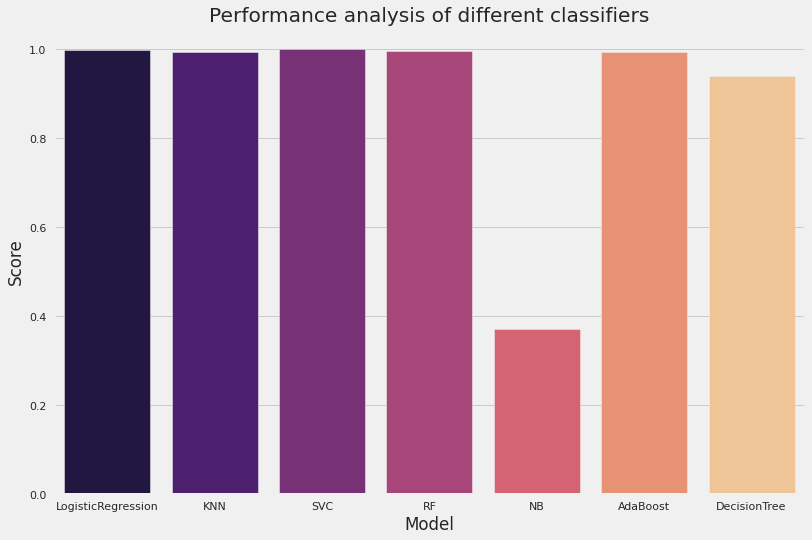

In [33]:
dataPerf = pd.DataFrame(data={'Model': ['LogisticRegression', 'KNN', 'SVC', 'RF','NB', 'AdaBoost', 'DecisionTree'], 'Score': [lrClassifier.score(xTest, yTest), knnClassifier.score(xTest, yTest), svClassifier.score(xTest, yTest), rfClassifier.score(xTest, yTest), nbClassifier.score(xTest, yTest), abClassifier.score(xTest, yTest), dtClassifier.score(xTest, yTest)]})

plt.figure(figsize=(12, 8))
sns.barplot(x="Model", y="Score", data=dataPerf, palette="magma")
plt.title('Performance analysis of different classifiers')
plt.show()

In [34]:
dataPerf

,Model,Score
0,LogisticRegression,0.998695
1,KNN,0.994781
2,SVC,1.000000
3,RF,0.996086
4,NB,0.370515
5,AdaBoost,0.994781
6,DecisionTree,0.940639


# **Confusion Matrices**

In [35]:
predRegression = lrClassifier.predict(xTest)
predSVM = svClassifier.predict(xTest)
predKNN = knnClassifier.predict(xTest)
predNB = nbClassifier.predict(xTest)
predAdaB = abClassifier.predict(xTest)
predDTree = dtClassifier.predict(xTest)
predRandomF = rfClassifier.predict(xTest)
predVals = pd.DataFrame(data={'truth': yTest, 'regression': predRegression, 'knn': predKNN, 'svm': predSVM, 'naive-bayes': predNB, 'random-forest': predRandomF, 'decision-tree': predDTree, 'ada-boost': predAdaB})

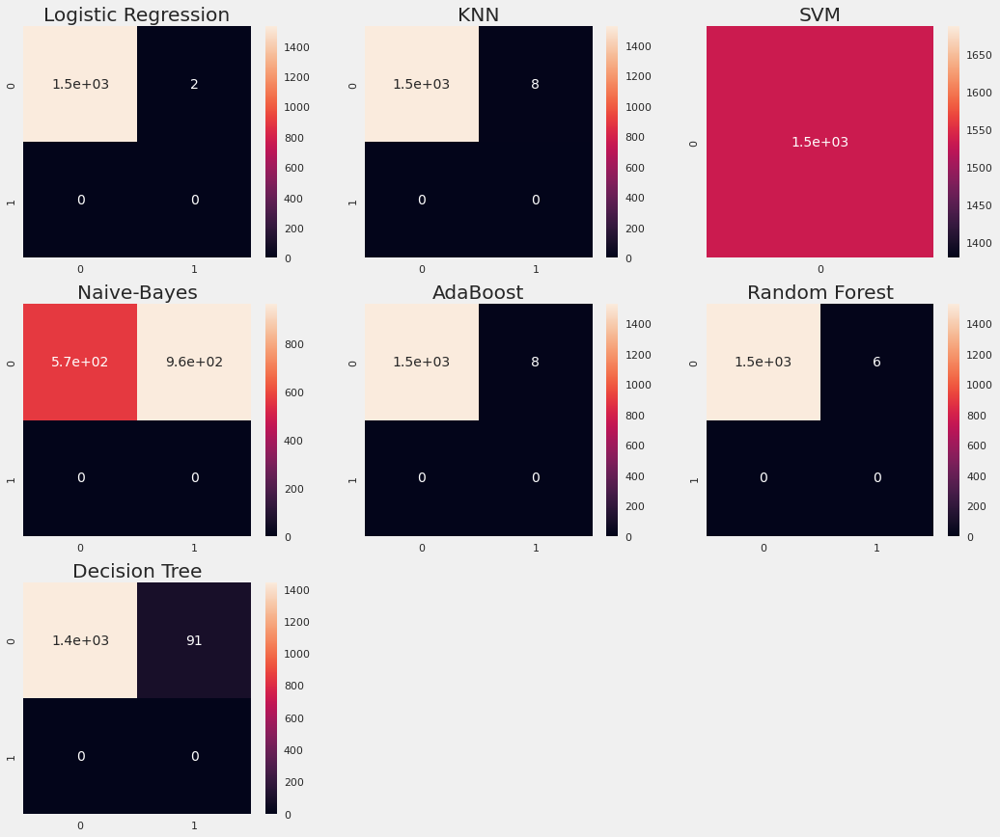

In [36]:
plt.figure(figsize=(16, 14))
plt.subplot(3, 3, 1)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predRegression), annot=True).set(title='Logistic Regression')
plt.subplot(3, 3, 2)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predKNN), annot=True).set(title='KNN')
plt.subplot(3, 3, 3)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predSVM), annot=True).set(title='SVM')
plt.subplot(3, 3, 4)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predNB), annot=True).set(title='Naive-Bayes')
plt.subplot(3, 3, 5)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predAdaB), annot=True).set(title='AdaBoost')
plt.subplot(3, 3, 6)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predRandomF), annot=True).set(title='Random Forest')
plt.subplot(3, 3, 7)
sns.heatmap(sklearn.metrics.confusion_matrix(yTest, predDTree), annot=True).set(title='Decision Tree')
plt.show()

----
#### Based on the above findings, we can conclude that the Support vector classifier is best suited for this classification, closely followed by Linear regression, Random forest and AdaBoost
----

<div style='font-size:200%;'>
    <a id='import'></a>
    <h3 style='color: orange; font-weight: bold; font-family: Cascadia code;'>
        <center> Alright, that's it folks, Thank you for the visit! </center>
    </h3>
    <h1 style='color: skyblue; font-weight: bold; font-family: Cascadia code;'>
        <center> Happy Kaggling! </center>
    </h1>
    <center><img style='height: 40%; width: 40%' src="https://miro.medium.com/max/3150/2*tQb2DNhHAMPj6u3peTXOFQ.png"> </center>
</div>